# Object Detection and Autopilot Safety analysis

# Part 1 : Object Detection

### Import libraries

In [1]:

import torch
import os
import shutil
import pathlib
from glob import glob
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import cv2
import numpy as np
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')


## Define the data paths

In [2]:
# For colab execution

zip_file_path = '/content/drive/MyDrive/DL/od.zip'

data_root_colab = '/content/drive/MyDrive/DL/Object Detection'
image_data_path_colab = '/content/drive/MyDrive/DL/Object Detection/Images'
labels_path_colab = f'{data_root_colab}/labels.csv'


#for Kaggle execution
image_data_path_kaggle = '/kaggle/input/object-detection/Object Detection/Images'
labels_path_kaggle = '/kaggle/input/object-detection/Object Detection/labels.csv'
data_root_kaggle = '.'


image_data_path = None
data_root = None
labels_path = None


if os.path.exists(image_data_path_kaggle):
    image_data_path = image_data_path_kaggle
    data_root = data_root_kaggle
    labels_path = labels_path_kaggle
    print(f'Using Kaggle data ')
else:
   print('Not on kaggle')
   from google.colab import drive
   drive.mount('/content/drive')
   data_root = data_root_colab
   image_data_path = image_data_path_colab
   labels_path = labels_path_colab
   if not os.path.exists(image_data_path):
         from zipfile import ZipFile
         zip_ref = ZipFile(zip_file_path,'r')
         zip_ref.extractall('/content/drive/MyDrive/DL/')
         zip_ref.close()

   print(f'Using Google Drive data')
print(f'image data path is {image_data_path}')

print(f'labels path is at {labels_path}')


Not on kaggle
Mounted at /content/drive
Using Google Drive data
image data path is /content/drive/MyDrive/DL/Object Detection/Images
labels path is at /content/drive/MyDrive/DL/Object Detection/labels.csv


## Create the directory structure for yolo training

In [3]:
# create train , validation and test image directories
train_label_path = 'datasets/train/labels'
val_labels_path = 'datasets/val/labels'
train_image_path = 'datasets/train/images'
val_image_path = 'datasets/val/images'
test_image_path = 'datasets/test/images'

In [4]:
dirs = [train_label_path,val_labels_path,train_image_path,val_image_path,test_image_path]

for d in dirs:
    if os.path.exists(d):
        shutil.rmtree(d)
    os.makedirs(d)
    print(f'created {d}')

if not os.path.exists('datasets/data.yaml'):
    pathlib.Path.touch('datasets/data.yaml')

created datasets/train/labels
created datasets/val/labels
created datasets/train/images
created datasets/val/images
created datasets/test/images


In [5]:
%ls datasets

data.yaml  test/  train/  val/


## Load the labels csv file

In [6]:
import pandas as pd

label_data = pd.read_csv(labels_path,names=['id','name','x_min','y_min','x_max','y_max'])
label_data = label_data.drop_duplicates('id')
label_data['id'] = label_data['id'].astype(str).str.zfill(8)
label_data = label_data.iloc[0:len(os.listdir(image_data_path))]
label_data['image'] = sorted(os.listdir(image_data_path))
print(label_data.shape)
label_data.head()

(5626, 7)


,id,name,x_min,y_min,x_max,y_max,image
0,00000000,pickup_truck,213,34,255,50,00000000.jpg
5,00000001,bus,205,155,568,314,00000001.jpg
11,00000002,motorized_vehicle,334,362,603,479,00000002.jpg
12,00000003,car,480,99,511,120,00000003.jpg
14,00000004,bus,439,32,719,171,00000004.jpg


## Estimate Vehicle numbers

In [ ]:
def copy_image_to_name(row):
  '''
  copies an image to the respective folder
  param : row
  '''
  name = row['name']
  dest = f'{data_root}/image_root/{name}/'
  if os.path.exists(dest):
    shutil.copy(f'{image_data_path}/{row["image"]}',dest)
  else:
    os.makedirs(dest)
    shutil.copy(f'{image_data_path}/{row["image"]}',dest)
_=label_data.apply(copy_image_to_name,axis=1)

In [ ]:
def get_subdirectories(directory) -> list:
    with os.scandir(directory) as entries:
        return [entry.name for entry in entries if entry.is_dir()]

def plot_class_numbers(directory,title) -> pd.DataFrame:
    '''
    Plots the number of images in each class
    :param directory: the directory containing the images
    :param title: the title of the plot
    :return: a dataframe containing the number of images in each class
    '''
    sub_dirs = get_subdirectories(directory)
    images = {}
    image_class = []
    num_images = []
    class_dict = {}

    for d in sub_dirs:
        image_class.append(d)
        num_images.append(len(os.listdir(str(directory)+'/'+d)))

    df = pd.DataFrame({'Image_Class':image_class,'Num_Images':num_images})
    df = df.sort_values(by='Num_Images',ascending=True).reset_index()

    indices = sorted(df['index'].values.tolist())
    class_names = df['Image_Class'].values
    for i in indices:
      class_dict[i] = class_names[i]
    sns.barplot(data=df,x='Image_Class',y='Num_Images',palette=sns.mpl_palette('Dark2'))
    plt.xlabel('vehicle types')
    plt.title(f' {title}' )
    plt.xticks(rotation = 90)
    plt.gca().spines[['top', 'right',]].set_visible(False)
    plt.show()
    return df

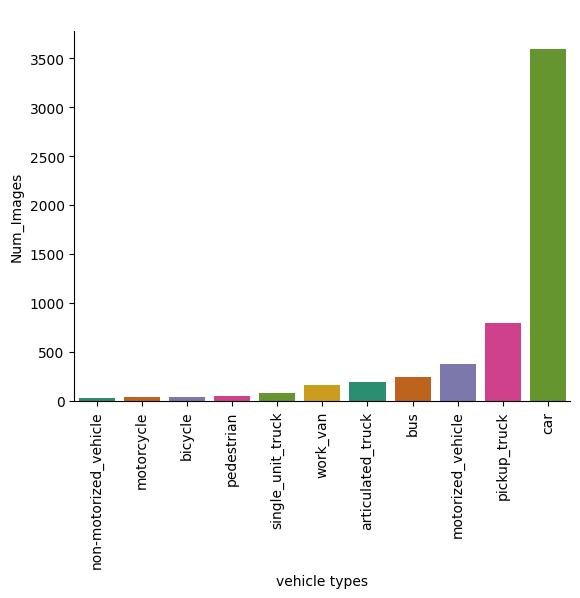

,index,Image_Class,Num_Images
0,6,non-motorized_vehicle,32
1,10,motorcycle,38
2,3,bicycle,43
3,5,pedestrian,56
4,9,single_unit_truck,80
5,7,work_van,161
6,1,articulated_truck,195
7,4,bus,244
8,8,motorized_vehicle,383
9,0,pickup_truck,801


In [ ]:
plot_class_numbers(f'{data_root}/image_root','')

There is substantial class imbalance

## Create a map of vehicle types to index

In [7]:
import pprint
class_names = label_data.name.unique().tolist()
d = {}
for i in range(len(class_names)):
  d[class_names[i]] = i
pprint.pprint(d)

{'articulated_truck': 4,
 'bicycle': 8,
 'bus': 1,
 'car': 3,
 'motorcycle': 10,
 'motorized_vehicle': 2,
 'non-motorized_vehicle': 7,
 'pedestrian': 6,
 'pickup_truck': 0,
 'single_unit_truck': 9,
 'work_van': 5}


## Create labels for training and validation

In [8]:
import cv2
import numpy as np
import pathlib
def  get_label_filename(row):
   return row['id']+'.txt'

def normalize_bb(x_min,y_min,x_max,y_max,id):
   img_path = f'{image_data_path}/{id}.jpg'
   if  os.path.exists(img_path):
      img = cv2.imread(img_path)
      image_height,image_width,_ = img.shape
      x_center = (x_min + x_max)/2
      y_center = (y_min + y_max)/2
      width = x_max - x_min
      height = y_max - y_min
      normalized_x_center = x_center / image_width
      normalized_y_center = y_center / image_height
      normalized_width = width / image_width
      normalized_height = height / image_height
      return normalized_x_center, normalized_y_center,  normalized_width , normalized_height


def get_label_data(row):
  dims = normalize_bb(row['x_min'], row['y_min'],row['x_max'],row['y_max'],row['id'])
  class_id = d.get(row['name'])
  yolo_annotaion = f'{class_id} {dims[0]:.3f} {dims[1]:.3f} {dims[2]:.3f} {dims[0]:.3f}'
  return yolo_annotaion

def get_image_width(row):
     img_path = f"{image_data_path}/{row['id']}.jpg"
     img = cv2.imread(img_path)
     return img.shape[1]

def get_image_height(row):
     img_path = f"{image_data_path}/{row['id']}.jpg"
     img = cv2.imread(img_path)
     return img.shape[0]


def create_yaml():
  file_path = 'datasets/data.yaml'
  if os.path.exists(file_path):
    os.remove(file_path)

  train = 'train: train'
  val = 'val: val'
  nc = "nc: 11"
  names = f"names: {str(class_names)}"
  lines_to_append = [train,val,nc,names]

  try:
    with open(file_path, 'a') as file:
      for line in lines_to_append:
          file.write(f'{line}\n')
    print('data.yaml created')
  except Exception as e:
    print(f"An error occurred: {e}")


## Create data.yaml for training

In [9]:
create_yaml()

data.yaml created


In [10]:
%cat datasets/data.yaml

train: train
val: val
nc: 11
names: ['pickup_truck', 'bus', 'motorized_vehicle', 'car', 'articulated_truck', 'work_van', 'pedestrian', 'non-motorized_vehicle', 'bicycle', 'single_unit_truck', 'motorcycle']


## Create annotations in YOLO5 format

In [11]:
from glob import glob
import warnings
warnings.filterwarnings('ignore')

num_images = len(glob(f'{image_data_path}/*.jpg'))
num_train_images = int(num_images*0.8)

num_test_images = 60
num_val_images = num_images - num_train_images - num_test_images

print(f'total :{num_images}, train : {num_train_images},  val :{num_val_images}, test:{num_test_images}')

labels_train = label_data.iloc[0:num_train_images]
labels_val = label_data.iloc[num_train_images:num_images-num_test_images]
print(f'train shape : {labels_train.shape}, val shape: {labels_val.shape}')


total :5626, train : 4500,  val :1066, test:60
train shape : (4500, 7), val shape: (1066, 7)


In [12]:
labels_train['filename'] = labels_train.apply(get_label_filename,axis=1)
labels_train['text'] = labels_train.apply(get_label_data,axis=1)
labels_train['image_width'] = labels_train.apply( get_image_width,axis=1)
labels_train['image_height'] = labels_train.apply( get_image_height,axis=1)

labels_val['filename'] = labels_val.apply( get_label_filename,axis=1)
labels_val['text'] = labels_val.apply( get_label_data,axis=1)
labels_val['image_width'] = labels_val.apply( get_image_width,axis=1)
labels_val['image_height'] = labels_val.apply( get_image_height,axis=1)

In [13]:
print(f'train shape : {labels_train.shape}, val shape: {labels_val.shape}')
labels_train.sample(10)

train shape : (4500, 11), val shape: (1066, 11)


,id,name,x_min,y_min,x_max,y_max,image,filename,text,image_width,image_height
13607,00004345,car,135,259,192,348,00004345.jpg,00004345.txt,3 0.227 0.632 0.079 0.227,720,480
3157,00001001,car,607,147,654,172,00001001.jpg,00001001.txt,3 0.876 0.332 0.065 0.876,720,480
9668,00003069,car,129,62,203,97,00003069.jpg,00003069.txt,3 0.485 0.349 0.216 0.485,342,228
8476,00002708,car,120,94,198,144,00002708.jpg,00002708.txt,3 0.465 0.522 0.228 0.465,342,228
5320,00001672,car,150,172,225,219,00001672.jpg,00001672.txt,3 0.260 0.407 0.104 0.260,720,480
5781,00001828,bicycle,357,136,394,236,00001828.jpg,00001828.txt,8 0.522 0.388 0.051 0.522,720,480
684,00000211,motorized_vehicle,0,244,72,351,00000211.jpg,00000211.txt,2 0.050 0.620 0.100 0.050,720,480
7226,00002261,car,514,159,715,292,00002261.jpg,00002261.txt,3 0.853 0.470 0.279 0.853,720,480
6702,00002114,car,70,130,219,201,00002114.jpg,00002114.txt,3 0.201 0.345 0.207 0.201,720,480
4456,00001412,pickup_truck,42,47,144,91,00001412.jpg,00001412.txt,0 0.272 0.303 0.298 0.272,342,228


## Define function to create the yolo label file

In [ ]:
from pathlib import Path

# create the label file
def create_label_file(label_path,file_name,text):

 f = Path(f'{label_path}/{file_name}')
 f.write_text(text)


 ## Create  label files for train and validation images

In [ ]:

labels_train.apply(lambda row: create_label_file(train_label_path,row['filename'],row['text']) , axis =1)
_=labels_val.apply(lambda row: create_label_file(val_labels_path,row['filename'],row['text']) , axis =1)

## Copy the images to train, val and test folders

In [ ]:
# copy train images
from tqdm import tqdm


def _copy(src,dest,file_name):
     if not src.startswith('.'):
       src_file = f'{src}/{file_name}'
       if not os.path.isdir(src_file):
          shutil.copy(src_file,dest)

num_train_images = labels_train.shape[0]
num_val_images = labels_val.shape[0]

images = sorted(os.listdir(image_data_path))

print(num_train_images,num_train_images+num_val_images,num_test_images)
print('Copying training images')
for i in tqdm(range(0,num_train_images)):
  _copy(image_data_path,f'{train_image_path}/',images[i])

print('Copying validation images')
for i in tqdm(range(num_train_images,num_train_images+num_val_images)):
  _copy(image_data_path,f'{val_image_path}/',images[i])

print('copying test imges')
for i in tqdm(range(num_train_images+num_val_images,num_images)):
  _copy(image_data_path,f'{test_image_path}/',images[i])




4500 5566 60
Copying training images


100%|██████████| 4500/4500 [00:08<00:00, 504.77it/s]


Copying validation images


100%|██████████| 1066/1066 [00:01<00:00, 533.72it/s]


copying test imges


100%|██████████| 60/60 [00:00<00:00, 542.26it/s]


## install ultralytics

In [ ]:
!pip install ultralytics > install.txt

## Train the model

In [ ]:
from ultralytics import YOLO
data_yaml_kaggle = "/kaggle/working/datasets/data.yaml"
data_yaml_colab = "/content/datasets/data.yaml"
epochs = 100
patience = 10
data_yaml = data_yaml_kaggle if os.path.exists(data_yaml_kaggle) else data_yaml_colab
model = YOLO("yolov5su.pt")
train_results=model.train(data=data_yaml, epochs=epochs, patience = patience,imgsz=640)

Ultralytics 8.3.107 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: task=detect, mode=train, model=yolov5su.pt, data=/kaggle/working/datasets/data.yaml, epochs=100, time=None, patience=10, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train3, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, l

train: Scanning /kaggle/working/datasets/train/labels.cache... 4500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 4500/4500 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /kaggle/working/datasets/val/labels.cache... 1066 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1066/1066 [00:00<?, ?it/s]


Plotting labels to runs/detect/train3/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000667, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train3
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      6.65G      1.887      4.267      1.829         12        640: 100%|██████████| 282/282 [01:13<00:00,  3.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.28it/s]


                   all       1066       1066      0.683       0.14     0.0755     0.0385

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      6.67G      1.631      2.714      1.666         11        640: 100%|██████████| 282/282 [01:11<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.30it/s]

                   all       1066       1066      0.615     0.0942     0.0654     0.0354



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.67G      1.605      2.582      1.647         11        640: 100%|██████████| 282/282 [01:11<00:00,  3.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.19it/s]


                   all       1066       1066      0.606     0.0992     0.0592     0.0328

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      6.67G      1.548      2.476      1.614          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.22it/s]

                   all       1066       1066      0.522      0.136     0.0906      0.051



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.67G      1.481      2.368      1.554          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.12it/s]

                   all       1066       1066      0.716      0.112     0.0891     0.0574



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.67G      1.422      2.242       1.52          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.24it/s]

                   all       1066       1066      0.733      0.114      0.124     0.0804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      6.67G      1.376      2.219      1.488          8        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.24it/s]

                   all       1066       1066      0.624      0.126      0.107       0.07



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.67G      1.338      2.132      1.459          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.18it/s]

                   all       1066       1066       0.69      0.196      0.156     0.0965



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      6.67G      1.293      2.081      1.428         11        640: 100%|██████████| 282/282 [01:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.29it/s]

                   all       1066       1066      0.395      0.187       0.14      0.092



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.67G      1.265      2.039      1.412          8        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.18it/s]

                   all       1066       1066      0.461      0.248      0.174      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.67G      1.247      2.026      1.392         12        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.24it/s]

                   all       1066       1066      0.725      0.149      0.181      0.126



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.67G      1.219      1.952      1.373         12        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.22it/s]

                   all       1066       1066      0.412      0.257      0.171      0.121



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.67G      1.219      1.929      1.364          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.25it/s]

                   all       1066       1066      0.499      0.287      0.197      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.67G      1.169      1.855       1.33          6        640: 100%|██████████| 282/282 [01:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.28it/s]

                   all       1066       1066      0.405      0.216      0.196      0.139



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      6.67G      1.175      1.862      1.333          8        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.19it/s]

                   all       1066       1066      0.347      0.304      0.217       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.67G      1.145      1.827      1.311          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.27it/s]

                   all       1066       1066      0.386      0.331      0.235      0.154



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      6.67G      1.132      1.801      1.305         10        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.21it/s]

                   all       1066       1066       0.33       0.35      0.243      0.169



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.67G      1.124      1.775      1.294          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.32it/s]

                   all       1066       1066      0.421      0.282      0.238       0.16



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      6.67G      1.113      1.762      1.285          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.30it/s]

                   all       1066       1066      0.288      0.337      0.246      0.175



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      6.67G      1.089      1.743       1.27          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.25it/s]

                   all       1066       1066       0.49      0.339       0.24      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.67G       1.07      1.725      1.256         11        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.41it/s]

                   all       1066       1066      0.575      0.243      0.248      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.67G      1.085      1.695      1.268         12        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.26it/s]

                   all       1066       1066      0.443      0.278      0.268      0.189



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.67G      1.041      1.673      1.244          4        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.40it/s]

                   all       1066       1066      0.321      0.381      0.258      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.67G      1.058      1.684      1.248         10        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.33it/s]

                   all       1066       1066      0.506      0.339      0.292      0.208



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      6.67G      1.043       1.65      1.239          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.27it/s]

                   all       1066       1066      0.243      0.376      0.267        0.2



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      6.67G      1.004      1.594      1.215          9        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.44it/s]

                   all       1066       1066      0.338      0.375      0.302      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.67G      1.024      1.646      1.223          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.31it/s]

                   all       1066       1066      0.386      0.281      0.289      0.199



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.67G     0.9985      1.607       1.21          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.35it/s]

                   all       1066       1066      0.466      0.349      0.293      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      6.67G     0.9956      1.588      1.206         11        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.20it/s]

                   all       1066       1066      0.425      0.374      0.296      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.67G      0.994       1.59      1.206          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.14it/s]

                   all       1066       1066      0.341      0.389      0.299      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.67G     0.9869      1.575      1.195          8        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.42it/s]

                   all       1066       1066      0.419       0.41      0.278      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.67G     0.9588      1.529      1.179          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.30it/s]

                   all       1066       1066      0.242       0.39       0.28      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.67G     0.9705      1.541      1.185          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.24it/s]

                   all       1066       1066      0.396      0.389      0.322      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      6.67G      0.958      1.517      1.183          6        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.36it/s]

                   all       1066       1066      0.347      0.383      0.311      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.67G     0.9581      1.541      1.184         10        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.21it/s]

                   all       1066       1066      0.331       0.41       0.29      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      6.67G     0.9421      1.508      1.171          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.34it/s]

                   all       1066       1066       0.26      0.417        0.3      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.67G     0.9267      1.483      1.158          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.32it/s]

                   all       1066       1066      0.478      0.356      0.308       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.67G     0.9275      1.468      1.157         10        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.19it/s]

                   all       1066       1066      0.468      0.346      0.321      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.67G      0.929      1.482      1.156          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.36it/s]

                   all       1066       1066      0.434       0.39      0.326      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.67G     0.9107      1.433      1.147          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.20it/s]

                   all       1066       1066      0.352      0.418      0.311      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.67G     0.9006      1.426      1.141          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.35it/s]

                   all       1066       1066      0.285      0.382      0.321      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.67G     0.9028      1.436       1.14          8        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.44it/s]

                   all       1066       1066      0.372      0.356      0.334      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.67G     0.8907      1.418      1.135          7        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.29it/s]

                   all       1066       1066      0.411      0.459      0.341      0.265



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.67G     0.8859      1.416      1.128          5        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.43it/s]

                   all       1066       1066      0.347      0.452      0.354      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      6.67G     0.8805      1.381       1.13          7        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.25it/s]

                   all       1066       1066      0.288      0.447      0.331      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.67G     0.8838      1.387      1.126          6        640: 100%|██████████| 282/282 [01:10<00:00,  4.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.32it/s]

                   all       1066       1066      0.448      0.343      0.305      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.67G     0.8759      1.373      1.119          5        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.49it/s]

                   all       1066       1066      0.393      0.357      0.329      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.67G     0.8776      1.393      1.124          6        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.47it/s]

                   all       1066       1066      0.274      0.456      0.323      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.67G     0.8612      1.352      1.115         11        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.31it/s]

                   all       1066       1066      0.403      0.451       0.36      0.281



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.67G     0.8492      1.337      1.105          8        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.28it/s]

                   all       1066       1066      0.325      0.422      0.353      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.67G     0.8587      1.326      1.116          9        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.36it/s]

                   all       1066       1066      0.452      0.379      0.353      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      6.67G     0.8389      1.334      1.099          9        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.43it/s]

                   all       1066       1066      0.435       0.39      0.339      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.67G     0.8477      1.309      1.107          4        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.46it/s]

                   all       1066       1066      0.365      0.411      0.354      0.276



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.67G     0.8392      1.309      1.107          4        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.40it/s]

                   all       1066       1066      0.364        0.4      0.354      0.278



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      6.67G     0.8323      1.305      1.095          5        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.27it/s]

                   all       1066       1066      0.276      0.427      0.327      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.67G     0.8401      1.293      1.095          6        640: 100%|██████████| 282/282 [01:09<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.09it/s]

                   all       1066       1066      0.469      0.346      0.337      0.269



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      6.67G     0.8336       1.29      1.089          6        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.33it/s]

                   all       1066       1066      0.288      0.417      0.348      0.275



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      6.67G     0.8166      1.266      1.087         11        640: 100%|██████████| 282/282 [01:10<00:00,  4.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.44it/s]

                   all       1066       1066      0.341      0.431      0.349      0.271



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.67G     0.8017      1.245      1.073          9        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.35it/s]

                   all       1066       1066      0.477       0.39      0.353      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.67G      0.808      1.234      1.079          7        640: 100%|██████████| 282/282 [01:10<00:00,  4.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.23it/s]

                   all       1066       1066      0.307      0.404      0.336      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.67G     0.7981       1.24      1.076          4        640: 100%|██████████| 282/282 [01:10<00:00,  4.00it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  5.28it/s]

                   all       1066       1066      0.498      0.362      0.347      0.268
EarlyStopping: Training stopped early as no improvement observed in last 10 epochs. Best results observed at epoch 51, best model saved as best.pt.
To update EarlyStopping(patience=10) pass a new patience value, i.e. `patience=300` or use `patience=0` to disable EarlyStopping.



61 epochs completed in 1.307 hours.
Optimizer stripped from runs/detect/train3/weights/last.pt, 18.5MB
Optimizer stripped from runs/detect/train3/weights/best.pt, 18.5MB

Validating runs/detect/train3/weights/best.pt...
Ultralytics 8.3.107 🚀 Python-3.11.11 torch-2.5.1+cu124 CUDA:0 (Tesla T4, 15095MiB)
YOLOv5s summary (fused): 84 layers, 9,115,793 parameters, 0 gradients, 23.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 34/34 [00:06<00:00,  4.93it/s]


                   all       1066       1066      0.452      0.378      0.353      0.283
          pickup_truck        154        154      0.436      0.558      0.488      0.424
                   bus         51         51      0.573      0.784       0.63      0.519
     motorized_vehicle         74         74      0.181     0.0811     0.0714     0.0482
                   car        667        667      0.444      0.594      0.518      0.428
     articulated_truck         28         28      0.367       0.56      0.465       0.37
              work_van         39         39      0.491      0.308      0.359      0.305
            pedestrian         13         13      0.293      0.154      0.136     0.0641
 non-motorized_vehicle          6          6          1          0    0.00137   0.000683
               bicycle          8          8      0.418      0.272      0.382      0.294
     single_unit_truck         18         18      0.356      0.222      0.173      0.134
            motorcycl

In [14]:
from glob import glob
def get_res_dir():
  res_dir_count = len(glob('runs/detect/*'))
  # print(f'current number of result directories : {res_dir_count}')
  res_dir = f'runs/detect/train{res_dir_count}'
  # print(f"result dir : {res_dir}")
  return res_dir

## Precision,Recall,Accuracy curves



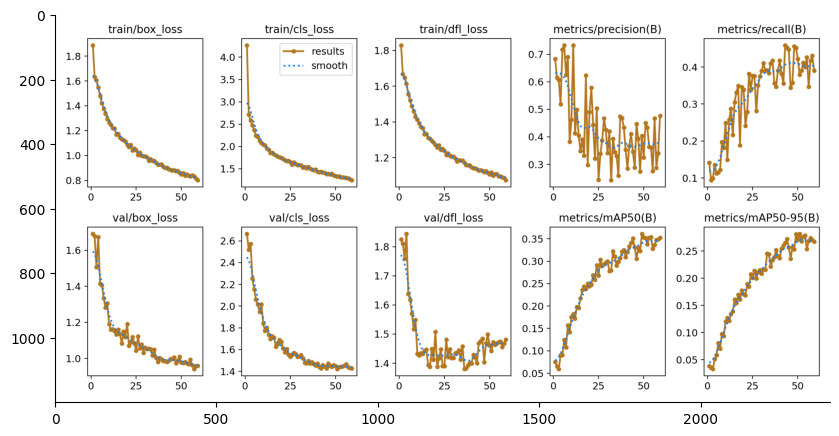

In [15]:
import cv2

plt.figure(figsize = (10,10))
res_dir = get_res_dir()
img = cv2.imread(f'{res_dir}/results.png')
plt.gca().spines[['top', 'right',]].set_visible(False)
_=plt.imshow(img)

## Confusion Matrix

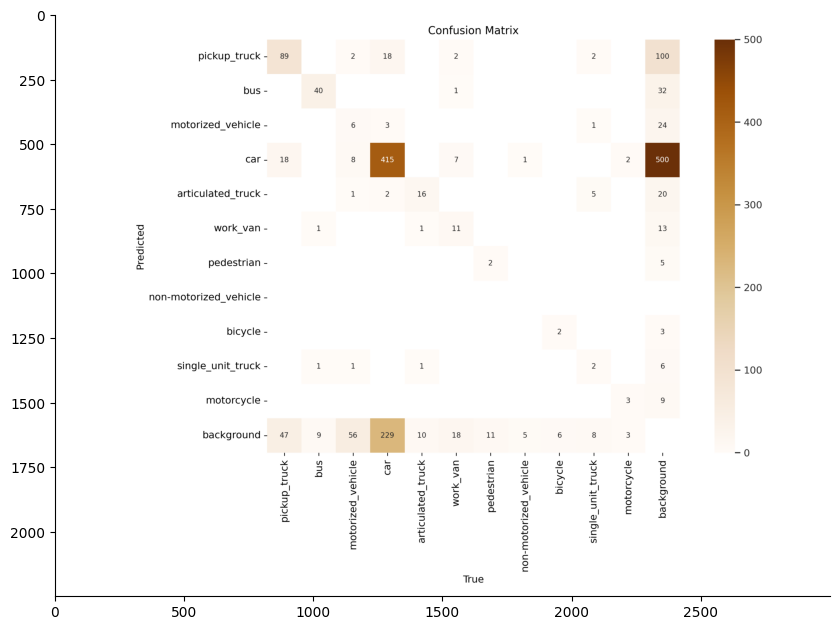

In [ ]:
plt.figure(figsize = (10,10))
img = cv2.imread(f'{res_dir}/confusion_matrix.png')
plt.gca().spines[['top', 'right',]].set_visible(False)
_=plt.imshow(img)

## Confusion Matrix Normalized

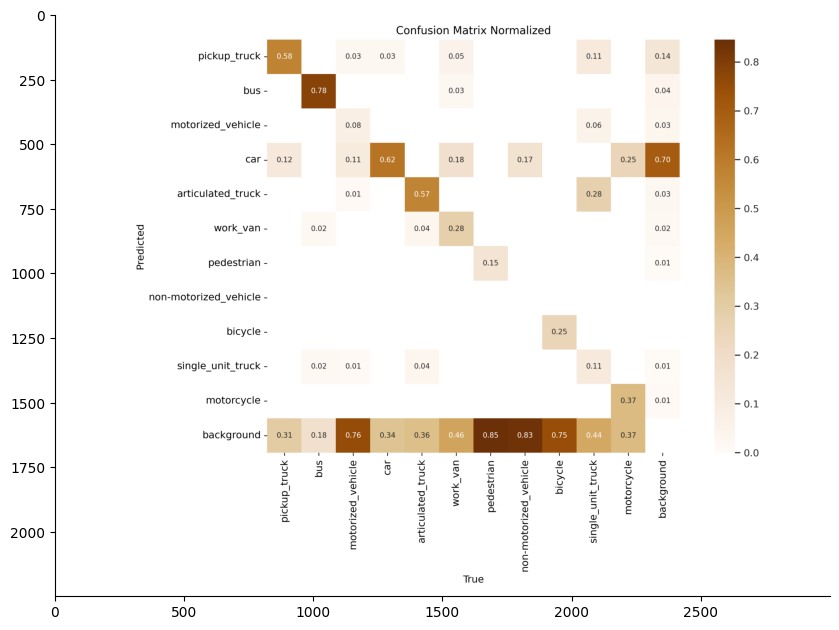

In [ ]:
plt.figure(figsize = (10,10))
img = cv2.imread(f'{res_dir}/confusion_matrix_normalized.png')
plt.gca().spines[['top', 'right',]].set_visible(False)
_=plt.imshow(img)

## Derive predictions

In [ ]:

results = model.predict(test_image_path)



image 1/60 /kaggle/working/datasets/test/images/00005598.jpg: 448x640 1 work_van, 11.9ms
image 2/60 /kaggle/working/datasets/test/images/00005599.jpg: 448x640 1 bus, 11.8ms
image 3/60 /kaggle/working/datasets/test/images/00005600.jpg: 448x640 1 car, 11.7ms
image 4/60 /kaggle/working/datasets/test/images/00005601.jpg: 448x640 (no detections), 11.7ms
image 5/60 /kaggle/working/datasets/test/images/00005602.jpg: 448x640 1 car, 11.8ms
image 6/60 /kaggle/working/datasets/test/images/00005603.jpg: 448x640 (no detections), 11.8ms
image 7/60 /kaggle/working/datasets/test/images/00005604.jpg: 448x640 1 pickup_truck, 1 car, 11.7ms
image 8/60 /kaggle/working/datasets/test/images/00005605.jpg: 448x640 1 pickup_truck, 11.8ms
image 9/60 /kaggle/working/datasets/test/images/00005606.jpg: 448x640 1 car, 11.8ms
image 10/60 /kaggle/working/datasets/test/images/00005607.jpg: 448x640 2 cars, 9.2ms
image 11/60 /kaggle/working/datasets/test/images/00005608.jpg: 448x640 (no detections), 9.2ms
image 12/60 /k

In [ ]:
def plot_box(image,boxes,labels):
    h,w,_ = image.shape
    for box_num,box in enumerate(boxes):
        xyxy = box.xyxy.int().tolist()
        xmin,ymin,xmax,ymax = xyxy[0][0], xyxy[0][1],xyxy[0][2],xyxy[0][3]
        width = xmax-xmin
        height = ymax-ymin
        class_name = class_names[int(labels[box_num])]
        color = COLORS[int(labels[box_num])]
        cv2.rectangle(image,(xmin,ymin),(xmax,ymax),color,5)
        font_scale = 1#min(1,max(3,int(w/500)))
        font_thickness = 2#min(2,max(10,int(w/50)))
        font = cv2.FONT_HERSHEY_SIMPLEX
        # p1,p1 = (int(xmin+1.5*width),ymin), (int(xmin+width),ymin-int(1.5*height))
        text_width = cv2.getTextSize(class_name,font,font_scale,font_thickness)[0][0]
        text_height = cv2.getTextSize(class_name,font,font_scale,font_thickness)[0][1]
        cv2.putText(image,class_name,(xmin,ymin+20),font,font_scale,color,font_thickness)
    names[path] = temp
    return image

def get_identified_names(image,boxes,labels):
    h,w,_ = image.shape
    temp = []
    for box_num,box in enumerate(boxes):
        xyxy = box.xyxy.int().tolist()
        xmin,ymin,xmax,ymax = xyxy[0][0], xyxy[0][1],xyxy[0][2],xyxy[0][3]
        width = xmax-xmin
        height = ymax-ymin
        class_name = class_names[int(labels[box_num])]
        temp.append(class_name)

    return temp


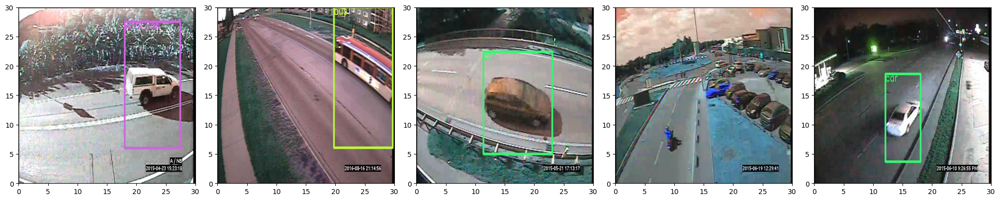

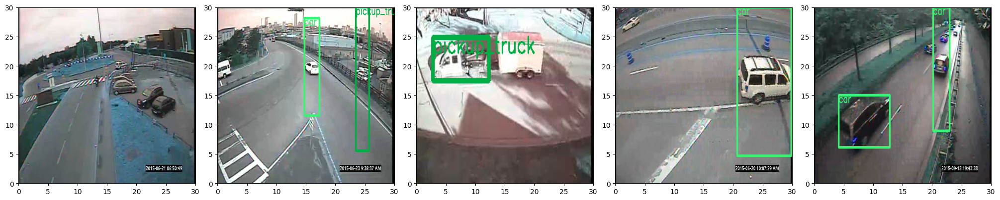

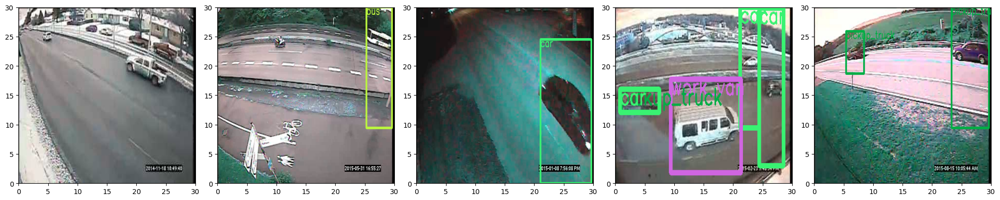

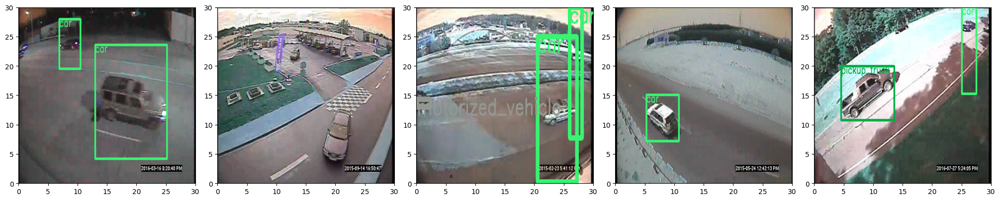

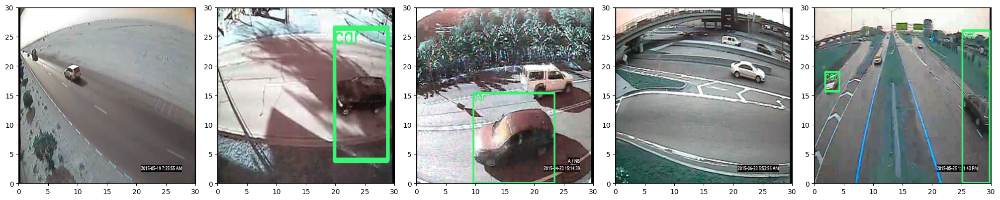

...

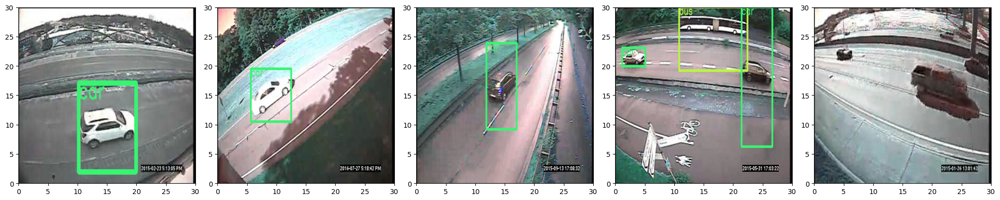

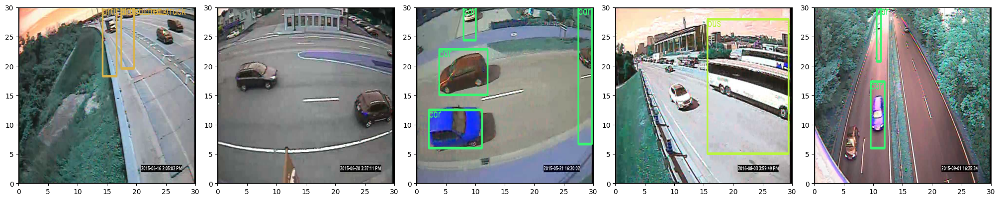

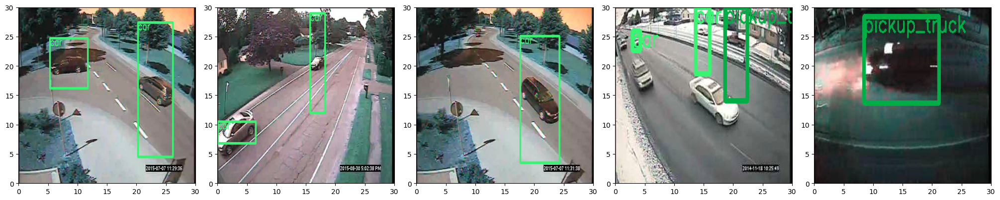

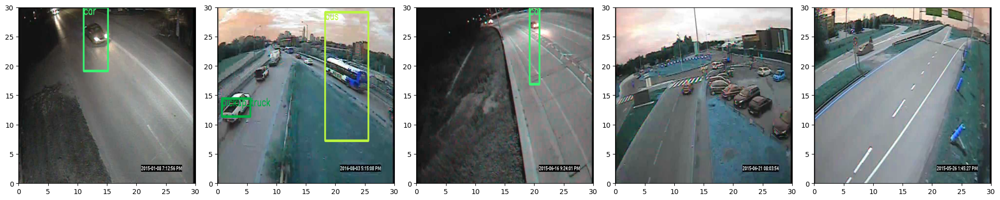

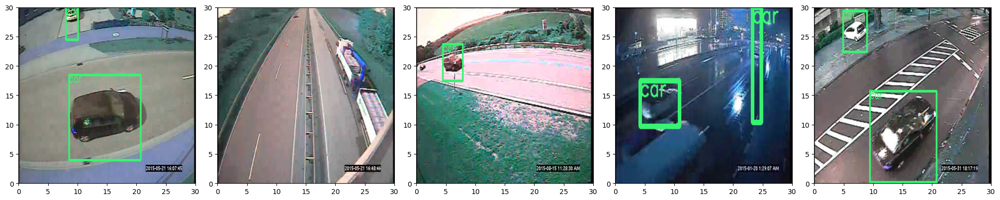

In [ ]:

COLORS = np.random.uniform(0,255,size=(len(class_names),3))
slices = []
count = 0
d = list()
images_per_row = 5
for j,res in enumerate(results):
    d.append(res)
    if len(d) == images_per_row:
      slices.append(d)
      d = list()



for i in (range(len(slices))):
  fig,axes = plt.subplots(nrows=1,ncols=images_per_row,figsize=(20,10),constrained_layout=True)
  results_ = slices[i]
  for j in range(len(results_)):
    res = results_[j]
    image = res.orig_img
    boxes = res.boxes
    confidences = boxes.conf
    classes = boxes.cls
    path = res.path
    box_img = plot_box(image,boxes,classes)
    axes[j].imshow(box_img, extent=[0, 30, 0, 30])



# Part 2 : Tesla Auto pilot and Road Safety

## Data wrangling

In [ ]:
import pandas as pd
import torch
torch.device('cpu')
url = 'https://raw.githubusercontent.com/tksundar/autonomous_driving/refs/heads/master/Tesla%20-%20Deaths.csv'
data = pd.read_csv(url, skip_blank_lines=True, skipinitialspace=True)
data.isna().sum()
data.columns = data.columns.str.rstrip()
nan_counts = data.isna().sum()
columns_to_drop = ['Unnamed: 16','Unnamed: 17','Source','State']
columns_to_drop.extend(nan_counts[nan_counts >= 220].index)
data.drop(columns_to_drop,axis=1,inplace=True)
# Remove rows that does not have a case number
# The values in these rows are outliers
data = data.dropna(subset=['Case #'])
print(data.shape)
print(data.isna().sum())

(294, 15)
Case #                                                                 0
Year                                                                   0
Date                                                                   0
Country                                                                0
Description                                                            0
Deaths                                                                 0
Tesla driver                                                           5
Tesla occupant                                                         9
Other vehicle                                                          4
Cyclists/ Peds                                                         3
TSLA+cycl / peds                                                       2
Model                                                                  0
Autopilot claimed                                                     18
Verified Tesla Autopilot Deaths          

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
columns = ['Deaths','Tesla driver', 'Tesla occupant', 'Other vehicle', 'Cyclists/ Peds',
       'TSLA+cycl / peds', 'Model', 'Autopilot claimed',
       'Verified Tesla Autopilot Deaths',
       'Verified Tesla Autopilot Deaths + All Deaths Reported to NHTSA SGO']
for col in columns:
  data[col] = data[col].apply(lambda x : '0' if  x in ['-',','] else x)
  data[col] = pd.to_numeric(data[col], errors='coerce')
  data[col] = data[col].fillna(0)
year_mode = data['Year'].mode()[0]
data['Year'] = data['Year'].apply(lambda x: year_mode if np.isnan(x) else x)
data['Year'] = data['Year'].apply(lambda x: year_mode if x == 202 else x)
data['Year'] = data['Year'].astype(int)
print(data.isna().sum())


Case #                                                                0
Year                                                                  0
Date                                                                  0
Country                                                               0
Description                                                           0
Deaths                                                                0
Tesla driver                                                          0
Tesla occupant                                                        0
Other vehicle                                                         0
Cyclists/ Peds                                                        0
TSLA+cycl / peds                                                      0
Model                                                                 0
Autopilot claimed                                                     0
Verified Tesla Autopilot Deaths                                 

## Distribution of numeric columns

In [ ]:
data['Country'] = data['Country'].str.rstrip()
data['Date'] = pd.to_datetime(data['Date'])
mod = data['Date'].mode()[0]
data['Date'] = data['Date'].fillna(mod)
data['Total Reported Deaths'] = data.apply(lambda row: row['Deaths']+row['Verified Tesla Autopilot Deaths + All Deaths Reported to NHTSA SGO'],axis = 1)

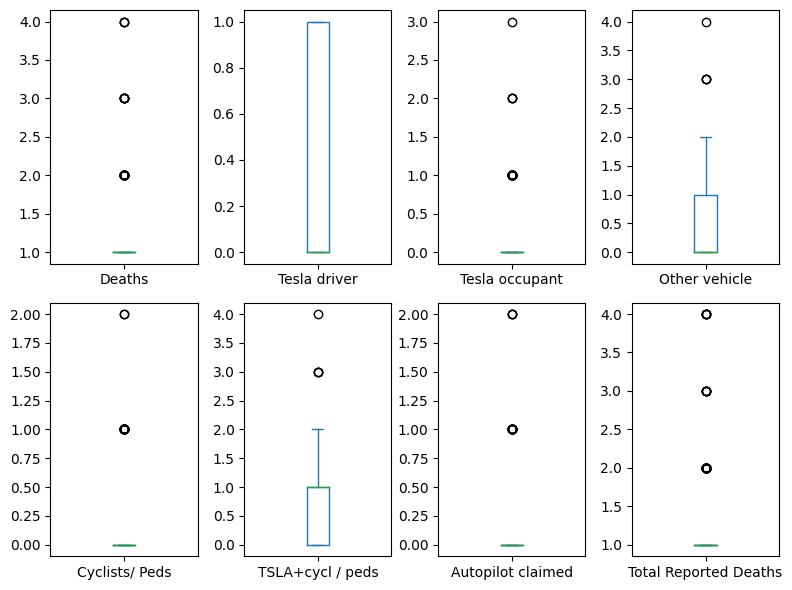

In [ ]:
columns = ['Deaths','Tesla driver','Tesla occupant','Other vehicle','Cyclists/ Peds','TSLA+cycl / peds','Autopilot claimed','Total Reported Deaths']
_=data[columns].plot(kind='box',
                       subplots=True,
                       layout=(2,4),
                       sharex=False,
                       sharey=False,
                       figsize=(8,6),)

plt.tight_layout()

In [ ]:

data.head()

,Case #,Year,Date,Country,Description,Deaths,Tesla driver,Tesla occupant,Other vehicle,Cyclists/ Peds,TSLA+cycl / peds,Model,Autopilot claimed,Verified Tesla Autopilot Deaths,Verified Tesla Autopilot Deaths + All Deaths Reported to NHTSA SGO,Total Reported Deaths
0,294.0,2022,2023-01-17,USA,Tesla crashes into back of semi,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
1,293.0,2022,2023-01-07,Canada,Tesla crashes,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
2,292.0,2022,2023-01-07,USA,"Tesla hits pole, catches on fire",1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
3,291.0,2022,2022-12-22,USA,Tesla crashes and burns,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
4,290.0,2022,2022-12-19,Canada,Tesla crashes into storefront,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0


## Accident Events by country

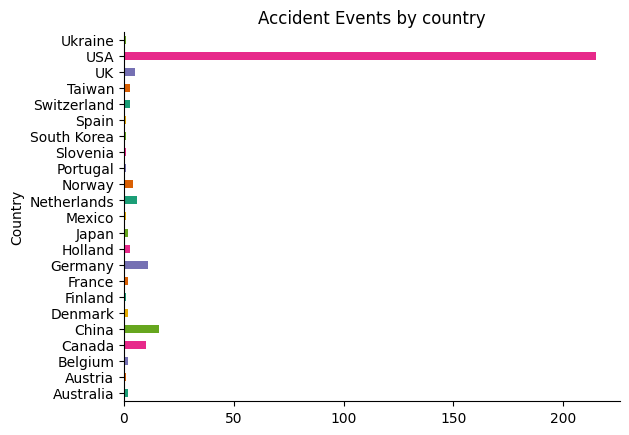

In [ ]:
from matplotlib import pyplot as plt
import seaborn as sns
data.groupby('Country').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)
_=plt.title('Accident Events by country')

## Deaths by year

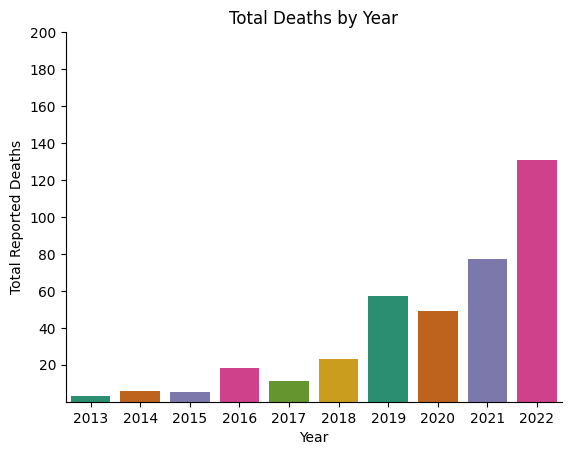

In [ ]:
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
deaths_by_year = pd.DataFrame(data.groupby('Year')['Total Reported Deaths'].sum()).reset_index()
plt.gca().spines[['top', 'right',]].set_visible(False)

fig=sns.barplot(data = deaths_by_year, x='Year', y='Total Reported Deaths' , palette = sns.mpl_palette('Dark2'))
plt.title('Total Deaths by Year')
plt.yticks(np.arange(20,220,20))
plt.show()

## Deaths by country and year

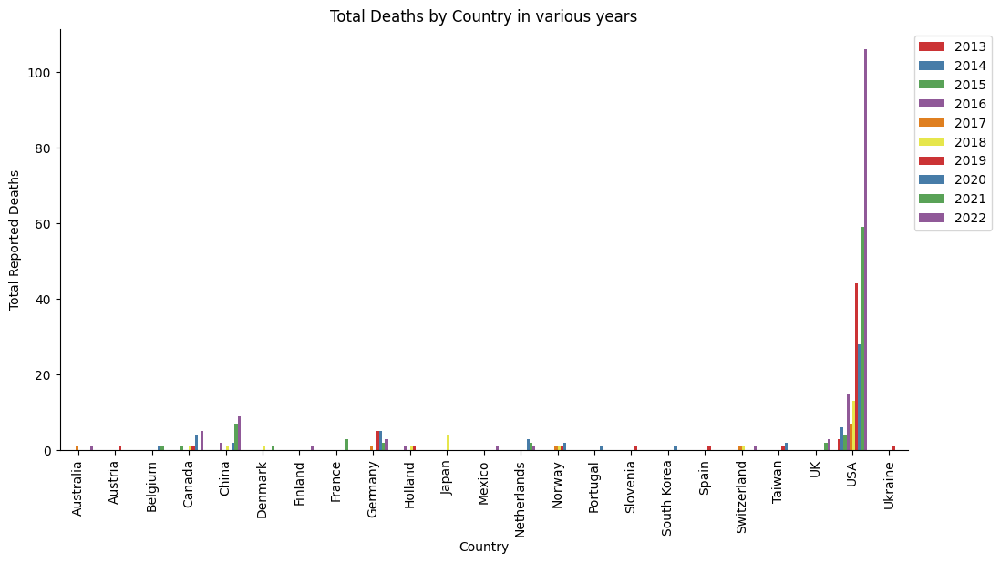

In [ ]:
deaths_by_year = pd.DataFrame(data.groupby(['Country','Year'])['Total Reported Deaths'].sum()).reset_index()

plt.figure(figsize = (12,6))
fig=sns.barplot(data = deaths_by_year, x='Country', hue = "Year", y='Total Reported Deaths',  palette = sns.mpl_palette('Set1'))
plt.title('Total Deaths by Country in various years')
plt.xticks(rotation=90)
plt.legend(bbox_to_anchor=(1, 1), loc="upper left")
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.show()

## Number of victims per accident

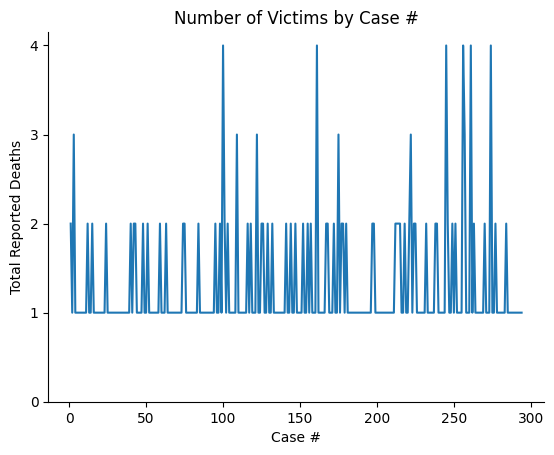

In [ ]:

df = data [['Case #','Total Reported Deaths']].sort_values(by='Case #')
sns.lineplot(data=df , x= 'Case #', y='Total Reported Deaths')
plt.gca().spines[['top', 'right',]].set_visible(False)
plt.yticks(np.arange(0,5))
_=plt.title('Number of Victims by Case #')

# Instances of Tesla driver deaths

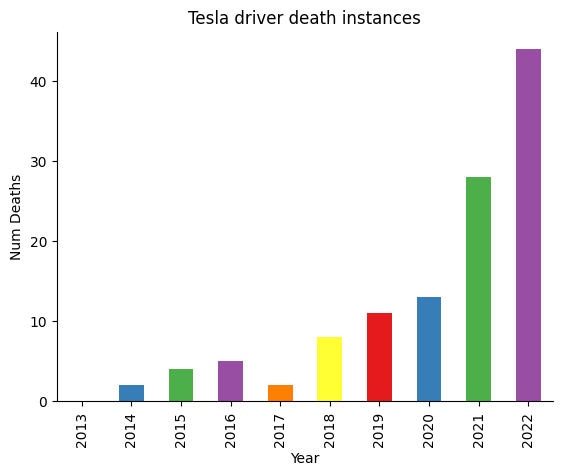

In [ ]:
_=data.groupby('Year')['Tesla driver'].sum().plot(kind='bar', color = sns.mpl_palette('Set1'))
plt.title('Tesla driver death instances')
plt.xlabel('Year')
plt.ylabel('Num Deaths')
plt.gca().spines[['top', 'right',]].set_visible(False)

## Instances of Tesla occupant deaths

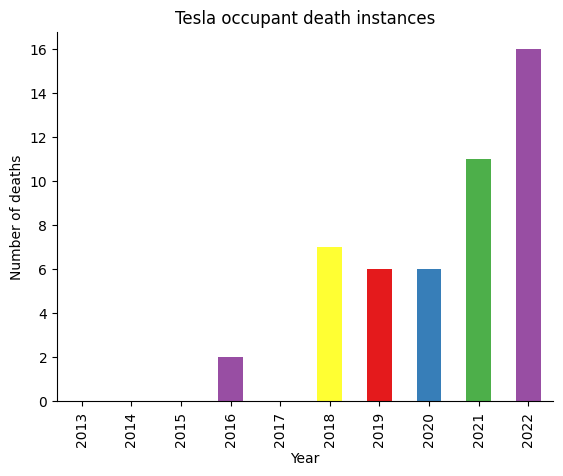

In [ ]:
data.groupby('Year')['Tesla occupant'].sum().plot(kind='bar', color = sns.mpl_palette('Set1'))
plt.title('Tesla occupant death instances')
plt.ylabel('Number of deaths')
plt.gca().spines[['top', 'right',]].set_visible(False)

## Distribution of events in which the vehicle hit a cyclist or a pedestrian

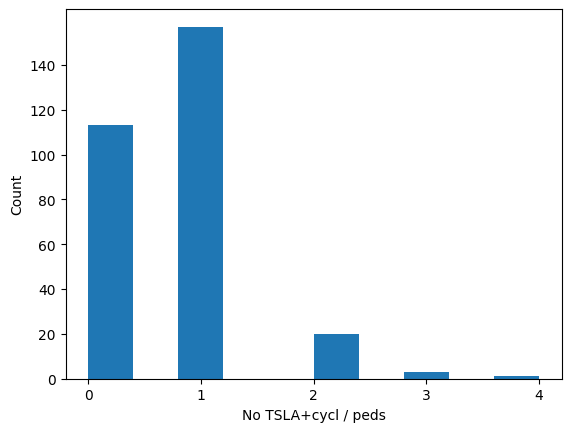

In [ ]:
_=data['TSLA+cycl / peds'].hist(bins=10,grid=False)
_=plt.xlabel('No TSLA+cycl / peds')
_=plt.xticks(np.arange(0,5,1))
_=plt.ylabel('Count')
_=plt.yticks(np.arange(0,160,20))

## Deaths of occupant, driver of a Tesla along with a cyclist or pedestrian

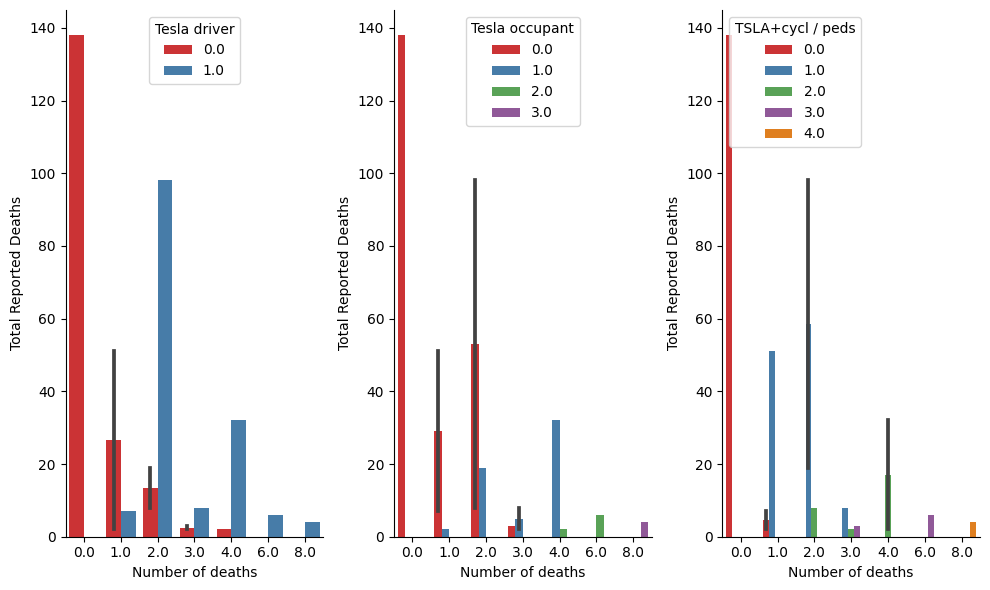

In [ ]:
columns = ['Tesla driver','Tesla occupant','TSLA+cycl / peds']
grp = pd.DataFrame(data.groupby(columns)['Total Reported Deaths'].sum()).reset_index()
grp['Cumulative'] = grp.apply(lambda row: row['Tesla driver'] + row['Tesla occupant'] + row['TSLA+cycl / peds'],axis = 1)
plt.figure(figsize=(10,6))
for i,col in enumerate(columns):
   plt.subplot(1,3,i+1)
   _=sns.barplot(data = grp , x = 'Cumulative',y='Total Reported Deaths',hue=col,palette = sns.mpl_palette('Set1'))
   _=plt.xlabel('Number of deaths')
   plt.gca().spines[['top', 'right',]].set_visible(False)

   plt.tight_layout()

In [ ]:
def check_for_two__vehicles(description):
  vehicles = []
  count = 0
  description_lower = description.lower()  # For case-insensitive matching
  temp = []
  for object_ in objects:
     if object_.lower() in description_lower:
       temp.append(object_)
       if(len(temp)>= 2):
         return 1
  return 0



url_labels = 'https://raw.githubusercontent.com/tksundar/autonomous_driving/refs/heads/master/labels.csv'
labels = pd.read_csv(url_labels, names = ['id','name','xmin','ymin','xmax','ymax'])

objects = labels['name'].unique().tolist()
objects.remove('pedestrian')
objects.append('Tesla')
objects.append('Semi')


## Frequency of Tesla colliding with other vehicles

Total multi vehicle collisions : 42



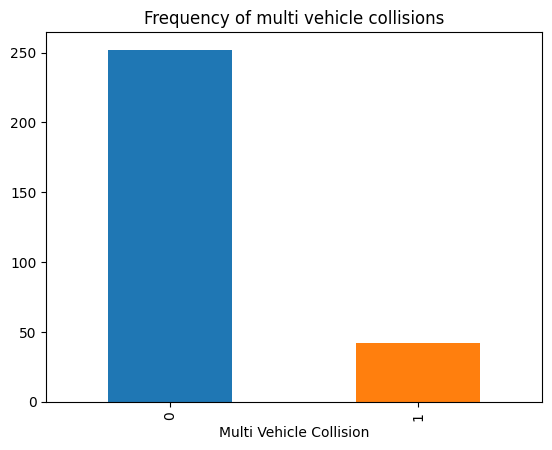

In [ ]:

data['Multi Vehicle Collision'] = data.apply(lambda row: check_for_two__vehicles(row['Description']),axis=1)
_=data.groupby(['Multi Vehicle Collision']).size().plot(kind = 'bar', color = sns.mpl_palette('tab10'))
plt.title('Frequency of multi vehicle collisions')

print(f"Total multi vehicle collisions : {data['Multi Vehicle Collision'].sum()}\n")

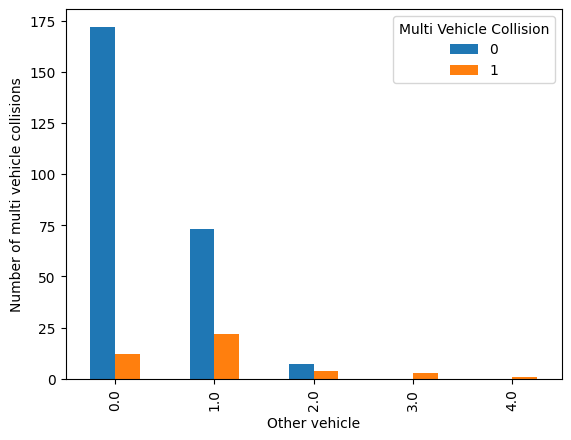

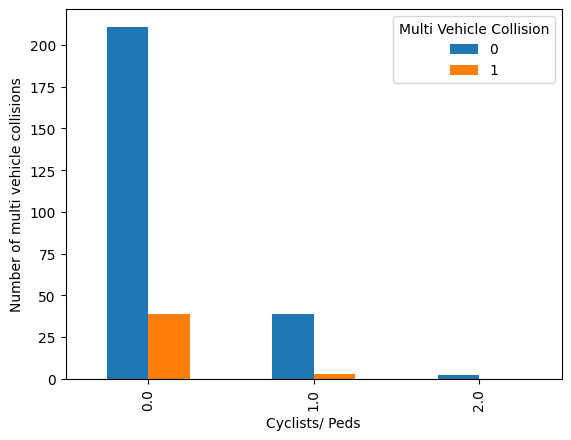

In [ ]:
_=pd.crosstab(data['Other vehicle'],data['Multi Vehicle Collision']).plot(kind='bar')
plt.ylabel('Number of multi vehicle collisions')
_=pd.crosstab(data['Cyclists/ Peds'],data['Multi Vehicle Collision']).plot(kind='bar')
_=plt.ylabel('Number of multi vehicle collisions')